In [8]:
import torch
from torchvision import transforms

In [11]:
preprocess = transforms.Compose(
    [
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(
            mean = [0.485, 0.456, 0.406],
            std = [0.229, 0.224, 0.225]
        )
    ]
)

In [13]:
from PIL import Image

In [14]:
img = Image.open("./t.jpg")

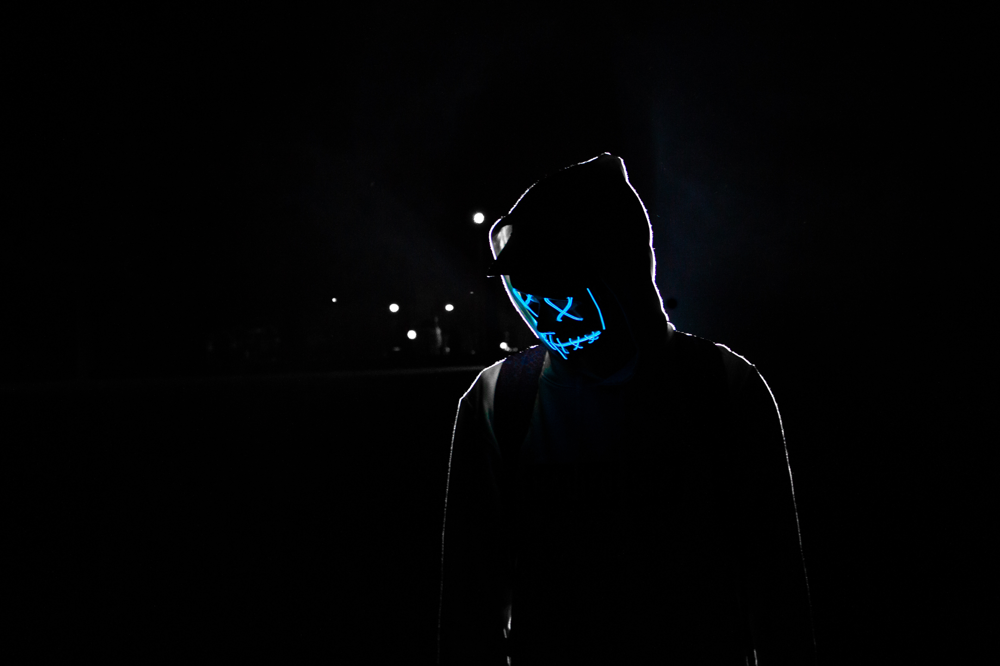

In [18]:
img

In [42]:
img_t = preprocess(img)
img_t

tensor([[[-2.1008, -2.1008, -2.1008,  ..., -2.0837, -2.0837, -2.1008],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.0837, -2.1008],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.0837, -2.1008],
         ...,
         [-2.1008, -2.1008, -2.1179,  ..., -2.1008, -2.1008, -2.1179],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.1179, -2.1008],
         [-2.1008, -2.1008, -2.1179,  ..., -2.1008, -2.1008, -2.1008]],

        [[-2.0182, -2.0182, -2.0182,  ..., -2.0007, -2.0007, -2.0182],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0182, -2.0007, -2.0182],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0182, -2.0007, -2.0182],
         ...,
         [-2.0182, -2.0182, -2.0357,  ..., -2.0182, -2.0182, -2.0357],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0182, -2.0357, -2.0182],
         [-2.0182, -2.0182, -2.0357,  ..., -2.0182, -2.0182, -2.0182]],

        [[-1.7870, -1.7870, -1.7870,  ..., -1.7696, -1.7696, -1.7870],
         [-1.7870, -1.7870, -1.7870,  ..., -1

In [30]:
import torch

In [35]:
batch_t = torch.unsqueeze(img_t,0)

In [37]:
from torchvision import models

In [38]:
resnet = models.resnet101(pretrained=True)

/home/dan/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/dan/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet101-63fe2227.pth" to /home/dan/.cache/torch/hub/checkpoints/resnet101-63fe2227.pth
13.8%IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Curren

In [44]:
resnet

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [45]:
resnet.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [47]:
out = resnet(batch_t)
out

tensor([[-8.1502e-01, -1.0746e+00, -4.0624e-01,  7.4092e-03, -5.3591e-02,
          1.1213e-01,  3.3611e-01, -3.5666e-01, -2.6135e+00, -2.3748e+00,
         -3.9050e+00, -3.9053e+00, -4.3057e+00, -1.4829e+00, -3.0303e+00,
         -1.5025e+00, -2.9114e+00, -6.5827e-01, -2.3283e+00, -2.9252e+00,
         -4.5934e+00, -1.4763e+00, -8.2804e-01, -8.4167e-01, -8.0795e-01,
         -2.7347e+00, -4.5745e+00, -1.5397e+00, -2.2969e-01, -3.4273e+00,
         -2.7114e+00, -7.5488e-01, -1.6982e+00, -1.4324e+00,  1.5932e-01,
         -5.5277e+00, -3.4039e+00, -3.9962e+00, -3.0334e+00, -2.1339e+00,
         -2.6518e+00, -3.4048e+00, -2.9665e+00, -2.0637e+00, -1.6041e+00,
         -1.6161e+00, -1.6022e+00, -2.3139e+00, -1.1729e+00, -2.5611e+00,
         -3.5229e+00,  1.5993e+00, -1.5468e+00, -6.9842e-01, -3.7791e-01,
         -7.3961e-01, -2.7809e+00, -3.3944e+00, -3.0719e+00,  7.2479e-01,
          1.9981e+00, -2.1725e+00, -2.8849e+00, -1.6834e+00, -2.5814e+00,
         -1.0792e+00, -2.1782e+00, -7.

In [48]:
with open ("./imagenet_classes.txt") as f:
    labels = [line.strip() for line in f.readlines()]

In [57]:
_, index = torch.max(out, 1)
index[0]

tensor(796)

In [53]:
percentage = torch.nn.functional.softmax(out, dim = 1)[0] * 100
labels[index[0]], percentage[index[0]].item()

('ski mask', 53.00457000732422)

In [55]:
_, indices = torch.sort(out, descending = True)
[(labels[idx], percentage[idx].item()) for idx in indices[0][:5]]

[('ski mask', 53.00457000732422),
 ('mask', 15.997425079345703),
 ('gasmask, respirator, gas helmet', 13.692370414733887),
 ('spotlight, spot', 3.8201704025268555),
 ('bubble', 1.709406852722168)]